<a href="https://colab.research.google.com/github/yahyaizala/ML/blob/master/ShipDetectionYolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%cd /content/
%rm -rf yolov5
%ls

/content
sample_data/


In [2]:
%ls

sample_data/


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%ls

drive/  sample_data/


# Step 2: Installing YOLOv5 on Colab




In [6]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt  # install dependencies



Cloning into 'yolov5'...
remote: Enumerating objects: 10237, done.
remote: Total 10237 (delta 0), reused 0 (delta 0), pack-reused 10237
Receiving objects: 100% (10237/10237), 10.40 MiB | 24.99 MiB/s, done.
Resolving deltas: 100% (7107/7107), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.1 MB/s 


In [7]:
import torch
from IPython.display import Image, clear_output  # to display images

#from utils.google_utils import gdrive_download #download models
clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.10.0+cu111 (Tesla K80)


# Set up Custom Dataset for YOLOv5

In [8]:
%ls

CONTRIBUTING.md  Dockerfile  LICENSE    requirements.txt*  tutorial.ipynb
data/            export.py   models/    setup.cfg          utils/
detect.py        hubconf.py  README.md  train.py           val.py


In [9]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 5
names: ['coast_multi', 'multi', 'multi_224', 'ok', 'ship']

Using Custom DataSet


In [10]:
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

# Download Data 

In [11]:
%cd /content/

/content


In [ ]:
%ls

drive/  sample_data/  yolov5/


In [ ]:
%cd yolov5/

/content/yolov5


In [12]:
!curl -L "https://app.roboflow.com/ds/LvE8GwKDca?key=DMuxm2Y4tZ" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1677      0 --:--:-- --:--:-- --:--:--  1674
100 26.9M  100 26.9M    0     0  30.1M      0 --:--:-- --:--:-- --:--:-- 30.1M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/m0001_png.rf.cfd1e4cb2316261226fcd57ddd490649.jpg  
 extracting: test/images/m0004_png.rf.3846eb2d01bb9984d0b07b0d3df109cc.jpg  
 extracting: test/images/m0019_png.rf.7245a1dc30a0a0a279b4e0a6748e5272.jpg  
 extracting: test/images/m0020_png.rf.6b890903d1b21145a86036a2bc9ec6ea.jpg  
 extracting: test/images/m0021_png.rf.aff48227c7cdb76e76c496a34b30a891.jpg  
 extracting: test/images/m0027_png.rf.a5c94d4d02ab024166571e84fb7fd718.jpg  
 extracting: test/images/m0074_png.rf.43f9652fc0b582550f97a64ea03487a6.jpg  
 

In [13]:
!pwd

/content


In [14]:
%cd /content/yolov5/

/content/yolov5


In [15]:
# Weights & Biases (optional)
%pip install -q wandb  
!wandb login 

     |████████████████████████████████| 1.7 MB 5.6 MB/s 
     |████████████████████████████████| 97 kB 6.5 MB/s 
     |████████████████████████████████| 180 kB 47.5 MB/s 
     |████████████████████████████████| 140 kB 49.5 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [16]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 5
names: ['coast_multi', 'multi', 'multi_224', 'ok', 'ship']

In [17]:
%ls

CONTRIBUTING.md  Dockerfile  models/            train.py
data/            export.py   README.md          tutorial.ipynb
data.yaml        hubconf.py  requirements.txt*  utils/
detect.py        LICENSE     setup.cfg          val.py


In [18]:
!python train.py --img 416 --batch 16 --epochs 50 --data data.yaml --weights yolov5s.pt --nosave --cache

wandb: Currently logged in as: kydev (use `wandb login --relogin` to force relogin)
train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-120-g92a7391 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0

In [21]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1398), started 0:05:57 ago. (Use '!kill 1398' to kill it.)

<IPython.core.display.Javascript object>

In [22]:
from IPython.display import Image,display
display(Image("runs/train/exp3/results.png"))

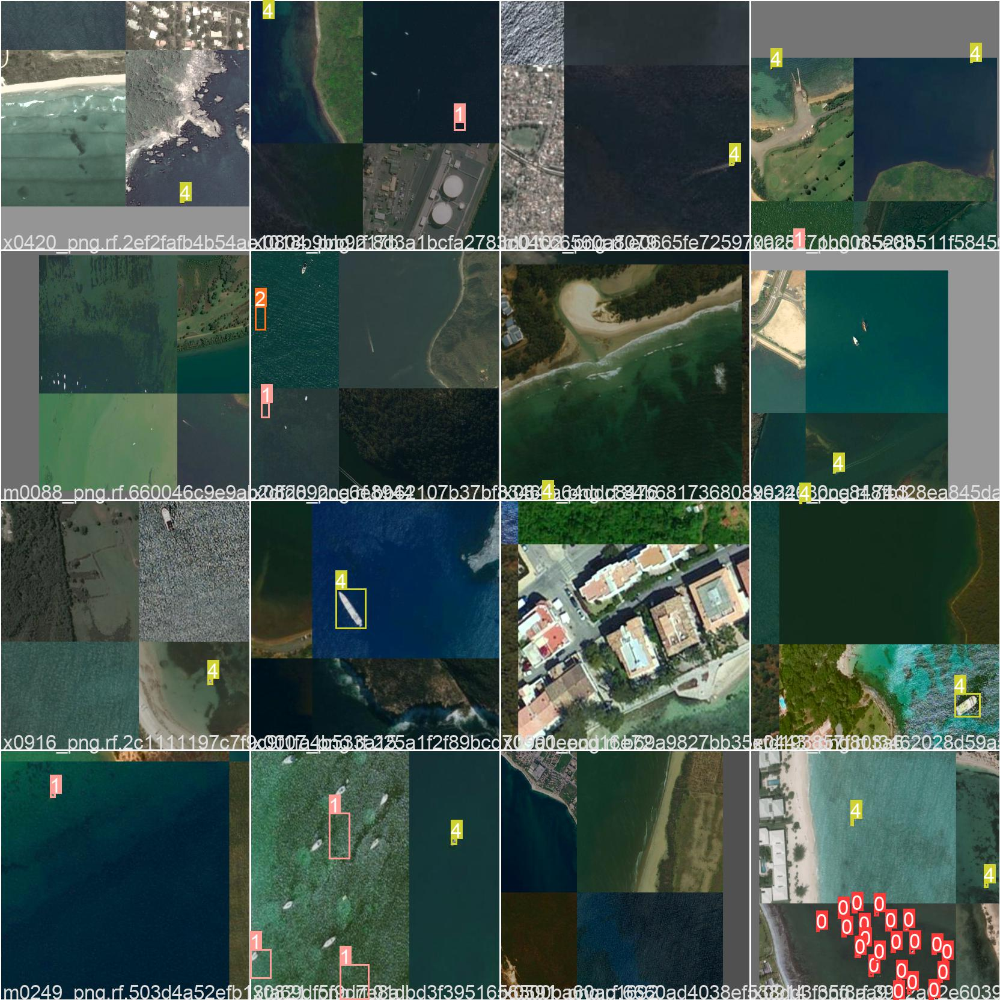

In [ ]:
Image(filename="runs/train/exp3/train_batch2.jpg")

In [24]:
!python detect.py --weights runs/train/exp/weights/last.pt --img 416  --source /content/test/images/ --conf 0.01

detect: weights=['runs/train/exp/weights/last.pt'], source=/content/test/images/, imgsz=[416, 416], conf_thres=0.01, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-120-g92a7391 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/134 /content/test/images/m0001_png.rf.cfd1e4cb2316261226fcd57ddd490649.jpg: 416x416 5 multis, Done. (0.029s)
image 2/134 /content/test/images/m0004_png.rf.3846eb2d01bb9984d0b07b0d3df109cc.jpg: 416x416 14 multis, Done. (0.029s)
image 3/134 /content/test/images/m0019_png.rf.7245a1dc30a0a0a279b4e0a6748e5272.jpg: 416x416 10 multis, Done. (0.029s)
image 4/134 /content/test/images/m0020_png

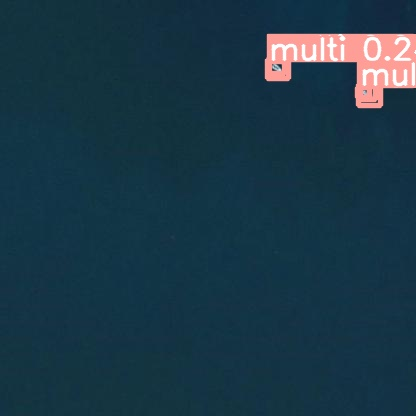

In [25]:
Image(filename="/content/yolov5/runs/detect/exp2/m0001_png.rf.cfd1e4cb2316261226fcd57ddd490649.jpg")

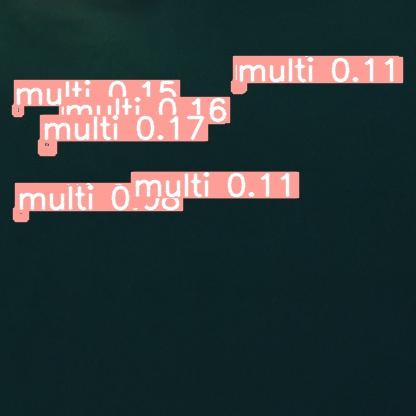

In [ ]:
Image(filename="/content/yolov5/runs/detect/exp3/m0224_png.rf.3d46711cf4e02392dff0aa3db984a0f7.jpg")

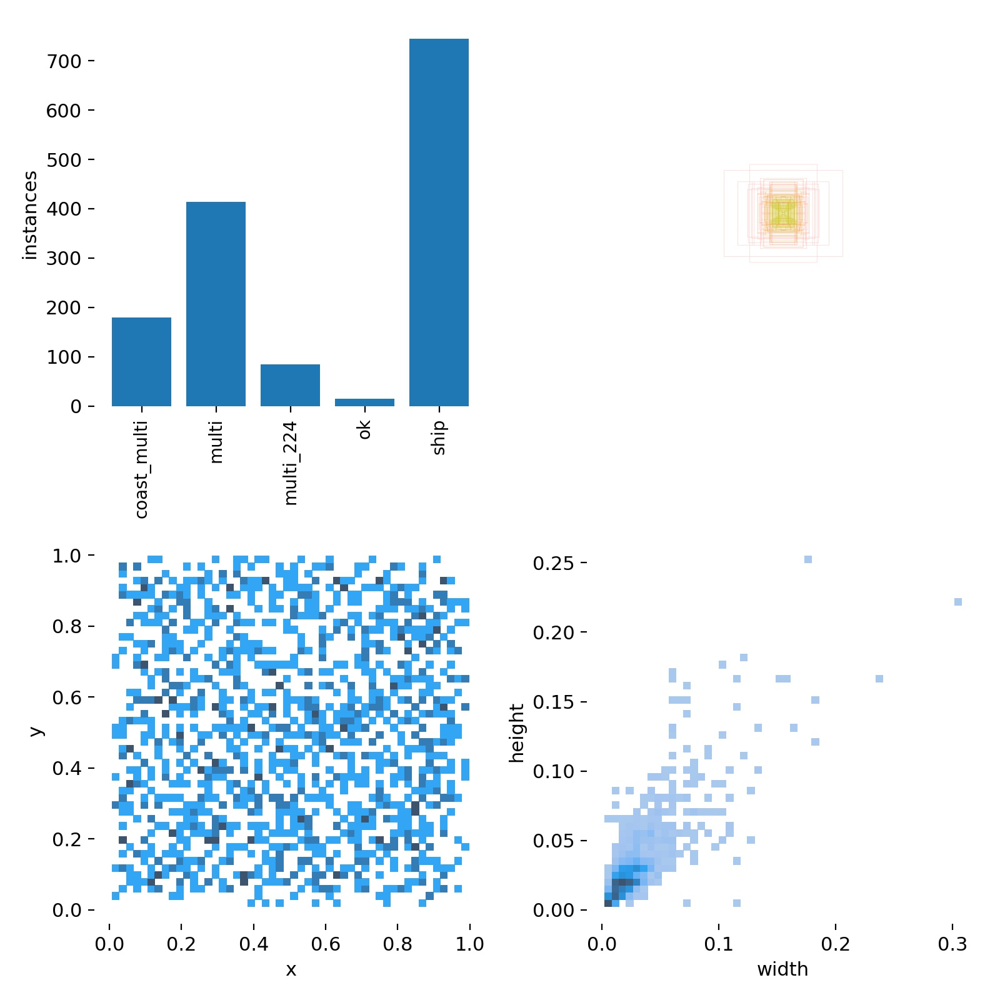

In [29]:
Image(filename="/content/yolov5/runs/train/exp/labels.jpg")

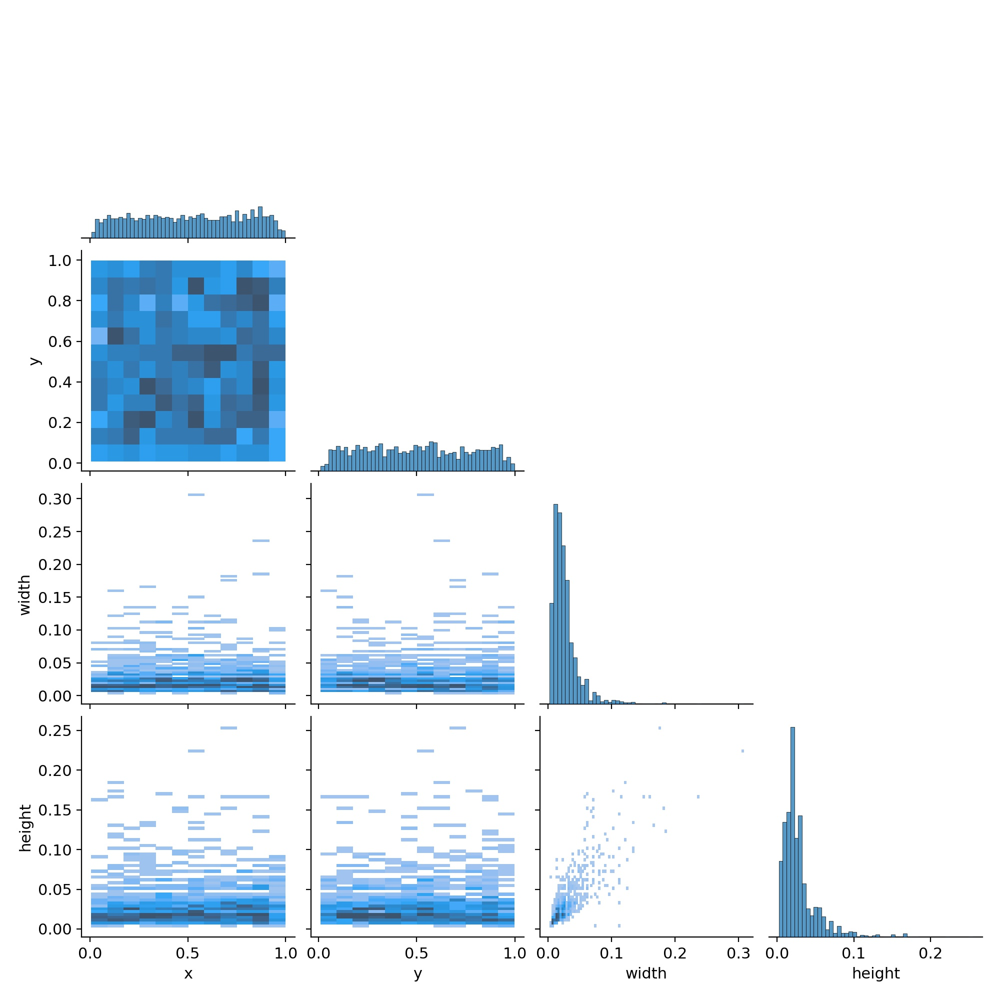

In [28]:
Image(filename="/content/yolov5/runs/train/exp/labels_correlogram.jpg")

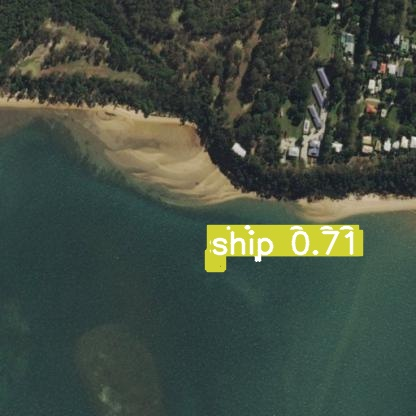

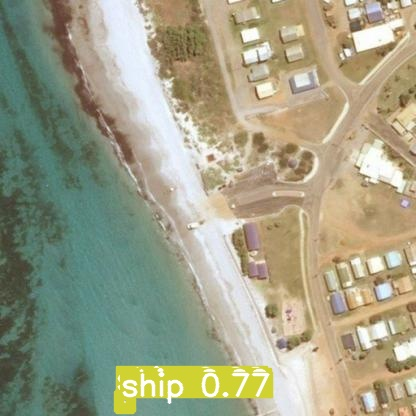

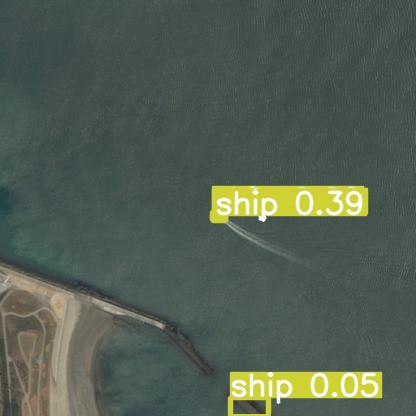

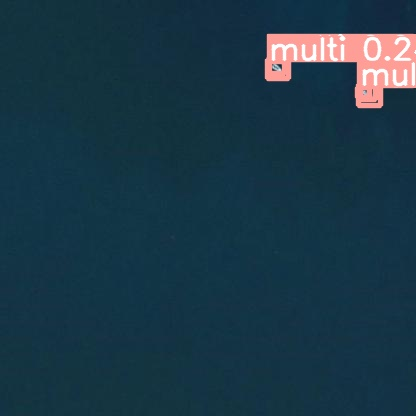

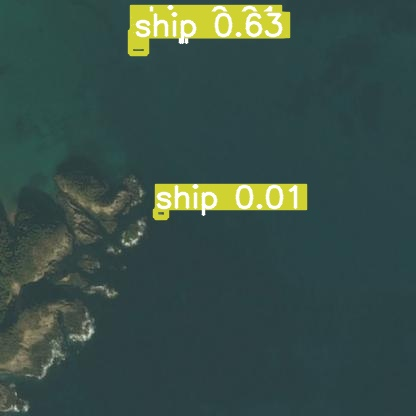

...

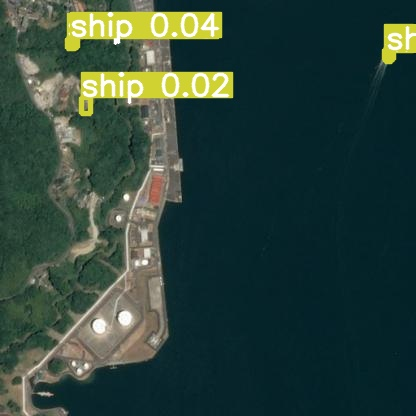

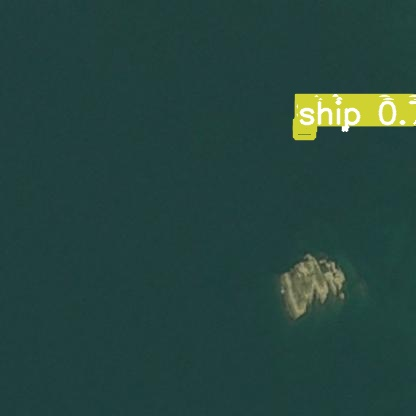

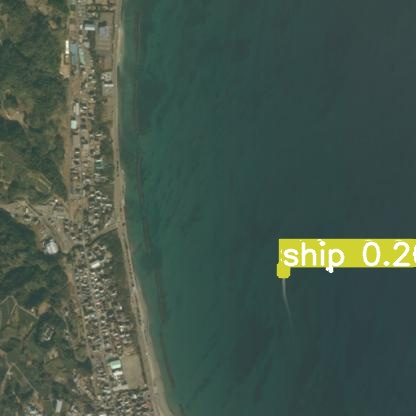

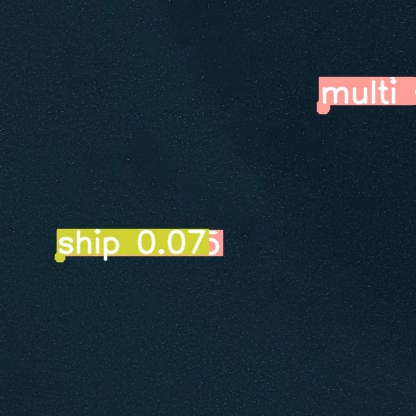

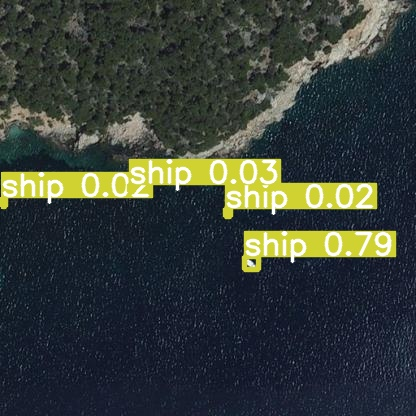



total 134


In [30]:
#display inference on ALL test images
#this looks much better with longer training above
import glob
from IPython.display import Image, display

i=0
for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    i+=1
    print("\n")
print(f"total {i}")